<a href="https://colab.research.google.com/github/sanxlop/tfm_etsit/blob/master/transfer_learning_model_for_image_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Model building process
- Firstly, model building process and configurations are explained step by step, specifically applied to the ETHZ Food-101 image dataset, although it could be extrapolated to any other image dataset. 
- Secondly, the architecture and features of the pre-trained models
used to transfer knowledge are presented to our classifier. Thirdly, is carried out with the experimental phase the analysis of the pre-trained models used for transfer learning. 
- Finally, the results obtained are analyzed and the optimal model for the project is chosen.

In [0]:
# Libraries
from google.colab import drive
from google.colab import files
import os
from os import listdir
from os.path import isfile, join
from collections import defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import tarfile
import shutil
import pickle
import itertools
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

## Data preparation
First of all, we must analyze the content of the dataset used. In this case, ETHZ Food-101 contains 101,000 images belonging equally to 101 categories, so we have 1,000 images per class. As a dataset competition, indicates for each class the images used for training and validation, being a ratio of 75% for training and 25% for validation. Training images present certain noise on purpose, and maximum image size is 512 pixels.

### Import data from drive
To start the proccess we are going to get access to our Google Drive account with  a token in order to be able to get files from there and save new ones.

In [0]:
# Get google drive access
drive.mount('/content/drive')

### Extract food-101.tar.gz
UnZip files inside food-101.tar.gz and divide the food categories into train a test folders as indicates the train.txt and test.txt included.

In [0]:
# Uncompress food-101 dataset
fname = 'drive/My Drive/food-101.tar.gz'
if (fname.endswith("tar.gz")):
  tar = tarfile.open(fname, "r:gz")
  tar.extractall()
  tar.close()

### Remove mislabeled images
Having mislabeled images that are not even food, we have used a blacklist to improve results. This is intended to prevent images with high probability that do not correspond to the category being recognized. For example, ticket images are categorized into hamburgers, because there are training images of a ticket in that category.

In [0]:
blacklist = pd.read_csv('drive/My Drive/blacklist-food-101', header=None)
for i in blacklist[0]:
  #print('food-101/images/'+i)
  os.remove('food-101/images/'+i)

### Split into train and validation
Due to the nature of the dataset and the challenge, it is not necessary to divide the dataset into train, validation, and test, since the dataset source images of train and validation are different. Additionally, fine-tuning this large dataset and image augmentation should not produce overfitting. Thus it is able to compare results with other implementations.

In [0]:
# Divide food-101 images into train and validation

# Only split files if haven't already
if not os.path.isdir('food-101/test') and not os.path.isdir('food-101/train'):

    def copytree(src, dst, symlinks = False, ignore = None):
        if not os.path.exists(dst):
            os.makedirs(dst)
            shutil.copystat(src, dst)
        lst = os.listdir(src)
        if ignore:
            excl = ignore(src, lst)
            lst = [x for x in lst if x not in excl]
        for item in lst:
            s = os.path.join(src, item)
            d = os.path.join(dst, item)
            if symlinks and os.path.islink(s):
                if os.path.lexists(d):
                    os.remove(d)
                os.symlink(os.readlink(s), d)
                try:
                    st = os.lstat(s)
                    mode = stat.S_IMODE(st.st_mode)
                    os.lchmod(d, mode)
                except:
                    pass # lchmod not available
            elif os.path.isdir(s):
                copytree(s, d, symlinks, ignore)
            else:
                shutil.copy2(s, d)

    def generate_dir_file_map(path):
        dir_files = defaultdict(list)
        with open(path, 'r') as txt:
            files = [l.strip() for l in txt.readlines()]
            for f in files:
                dir_name, id = f.split('/')
                dir_files[dir_name].append(id + '.jpg')
        return dir_files

    train_dir_files = generate_dir_file_map('food-101/meta/train.txt')
    test_dir_files = generate_dir_file_map('food-101/meta/test.txt')


    def ignore_train(d, filenames):
        print(d)
        subdir = d.split('/')[-1]
        to_ignore = train_dir_files[subdir]
        return to_ignore

    def ignore_test(d, filenames):
        print(d)
        subdir = d.split('/')[-1]
        to_ignore = test_dir_files[subdir]
        return to_ignore

    copytree('food-101/images', 'food-101/test', ignore=ignore_train)
    copytree('food-101/images', 'food-101/train', ignore=ignore_test)
    
else:
    print('Train/Test files already copied into separate folders.')

### Keras libraries and configuration

At this step we are taking all Keras libraries needed for the building process.

In [0]:
from keras.applications.resnet50 import ResNet50#, preprocess_input
from keras.applications.inception_resnet_v2 import InceptionResNetV2#, preprocess_input
from keras.applications.mobilenet_v2 import MobileNetV2#, preprocess_input
from keras.applications.xception import Xception, preprocess_input

from keras.layers import Dense, Input, GlobalAveragePooling2D, Dropout
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model, Model
from keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler, ReduceLROnPlateau, TensorBoard
from keras.optimizers import SGD

from keras.preprocessing.image import array_to_img, img_to_array, load_img

from keras import backend as K
import tensorflow as tf

K.clear_session()
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

## Architecture selection and configuration
Once configured the data generators of training and validation, we select the pre-trained model loaded with the weights of the ImageNet dataset. Keras offers several possibilities such as Inception, ResNet, VGGNet, DenseNet ... of which will have to choose the most appropriate depending on the dataset and computational capacity.

Batch size indicates the number of training samples present in a single batch to be spread over the network at each training iteration. These samples are processed in parallel batch independently. It is usually better to have a greater number of images in batch in each training iteration to improve learning quality and convergence rate. However, it is not always possible since the available memory in the hardware is a limiting factor. 

Therefore, larger batch sizes tend to converge faster and produce better performance. A larger batch size should improve optimization steps and obtain greater convergence speed. In addition, performance can be improved by reducing the number of communications between the GPU. In this project has been chosen batch size 16, 32 or 64.

In [0]:
# InceptionResNetV2 | 299x299 | b32 (7000s)
# ResNet50 | 224x224 | b32 (2550s)
# MobileNetV2 | 224x224 | b64 (1870s)
# Xception | 299x299 | b16 (6700s)

NET = 'Xception' 

# Configuration
IMG_SHAPE = (299, 299, 3) 
IMG_SIZE = (IMG_SHAPE[0], IMG_SHAPE[1])
BATCH_SIZE = 16
EPOCHS = 25

# Directories
test_folder = 'blacklist' #write test if testing
drive_path = 'drive/My Drive/'
base_name = NET+'-'+str(IMG_SHAPE[0])+'x'+str(IMG_SHAPE[0])+'-b'+str(BATCH_SIZE)+'-e'+str(EPOCHS)
folder_path = drive_path+test_folder+base_name+'/'
model_file_name_best = 'model-best-'+base_name+'.h5'
model_file_name_last = 'model-last-'+base_name+'.h5'
log_file_name = 'log_model-'+base_name+'.log'

# Create folder for results
if not os.path.exists(folder_path):
  os.makedirs(folder_path)

## Image data generation with augmentation and pre-processing
A convolutional neural network must be invariant against different object orientations, which implies image augmentation for its training. This option is good for both when you have little data, and when you have a large dataset. On the one hand, more images are obtained for the training. On the other hand, more relevant data is obtained. 

The validation image generator is advisable to not use data augmentation since different values of accuracy and loss would be obtained in each epoch and what is wanted is to evaluate the model with images that serve to check if training results improve or get overfitted. This statement invites us to think that it would train by producing overfitting, but when training the network with augmented images in each epoch is difficult to produce that effect.

The training image generator includes image augmentation techniques while the validation image generator only includes the preprocessing of the image. 

### ImageDataGenerator and DataFlow

In [0]:
# Configuration of ImageDataGenerator divided in Train/Validation
datagen_train = ImageDataGenerator(
                        rotation_range=40,
                        width_shift_range=0.2,
                        height_shift_range=0.2,
                        shear_range=0.2,
                        zoom_range=0.2,
                        horizontal_flip=True,
                        fill_mode='nearest',
                        preprocessing_function = preprocess_input
)
datagen_validation = ImageDataGenerator(
                        preprocessing_function = preprocess_input
)

# Configuration of data flow divided in Train/Validation
train_generator = datagen_train.flow_from_directory(
                            'food-101/train/',
                            target_size=IMG_SIZE,
                            batch_size=BATCH_SIZE,
                            class_mode='categorical')
validation_generator = datagen_validation.flow_from_directory(
                            'food-101/test/',
                            shuffle = False,
                            target_size=IMG_SIZE,
                            batch_size=BATCH_SIZE,
                            class_mode='categorical')

Found 75328 images belonging to 101 classes.
Found 25189 images belonging to 101 classes.


### Get list of classes

In [0]:
# Get list of classes of food-101
list_classes = []
for key, value in train_generator.class_indices.items():
    #print(key, value)
    list_classes.append(key)

## Build or Load model

### Load model (Optional)
If we have already a built model we only need to load it and **skip following steps**

In [0]:
#model = load_model(folder_path+model_file_name_last)

### Build model
After selecting the architecture, the convolutional base of the model is loaded without including the part of the classifier to be able to adjust it to the desired requirements. Subsequently, the classifier composed of pooling layers and dense layers is created, with the option of adding a dropout layer. Dropout layer will be necessary when the dataset with which it goes to fine-tuned is small. Dense layer indicates the number of classes to classify and the activation function used.

In [0]:
def build_model(net):
  # Select model and load convolutional base
  if(net == 'ResNet50'):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=IMG_SHAPE, input_tensor=Input(shape=IMG_SHAPE))
  elif(net == 'InceptionResNetV2'):
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=IMG_SHAPE, input_tensor=Input(shape=IMG_SHAPE))
  elif(net == 'MobileNetV2'):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=IMG_SHAPE, input_tensor=Input(shape=IMG_SHAPE))
  elif(net == 'Xception'):
    base_model = Xception(weights='imagenet', include_top=False, input_shape=IMG_SHAPE, input_tensor=Input(shape=IMG_SHAPE))
  
  # Adapt model fine-tuning
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  #x = Dropout(rate=0.2)(x) #to avoid overfitting if few samples
  predictions = Dense(len(list_classes), activation='softmax')(x)
  model = Model(inputs=base_model.input, outputs=predictions)
   
  return model

model = build_model(NET)

Instructions for updating:
Colocations handled automatically by placer.
219062272/219055592 [==============================] - 2s 0us/step


### Freezing layers (Optional)

In [0]:
# #Freeze the layers except the last 4 layers
# for layer in model.layers[:-10]:
#   layer.trainable = False
    
# #Check the trainable status of the individual layers
# for layer in model.layers:
#   print(layer, layer.trainable)

### Compile configuration
At this point, we just need to compile the model with the optimizer, losses function and training metrics.

Among the optimizers available in Keras are SGD, RMSprop, Adagrad, Adadelta, Adam, Adamax and Nadam. As previously seen, the Most Used for training images are Adam and SGD for ITS rapid convergence. In addition, to fine-tune a model, SGD works very well as it converges rapidly. This project is set SGD with adaptive learning rate. The losses function is categorical cross-entropy because it is defining a classification system with several classes and the training evaluation metric chosen is the accuracy for having equitable data of each category.

In [0]:
# Select Optimizer
sgd = SGD(lr=0.01, momentum=0.9)

# Compile model
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

## Model training

### Read epoch history (Optional)
Read epoch log history file if you have trained a model previously and you want to continue training.

In [0]:
# Read last epochs results
print(folder_path+log_file_name)
pd_log = pd.read_csv(folder_path+log_file_name)
pd_log.index += 1
pd_log.epoch += 1
display(pd_log)

aux = pd.DataFrame(columns=pd_log.columns)
aux.loc[0] = [0,0,0,0,0,0]
aux = aux.append(pd_log)

drive/My Drive/blacklistXception-299x299-b16-e25/log_model-Xception-299x299-b16-e25.log


,epoch,acc,loss,lr,val_acc,val_loss
1,1,0.578337,1.653021,0.010000,0.674501,1.252348
2,2,0.718219,1.043036,0.010000,0.768629,0.848335
3,3,0.765652,0.852237,0.010000,0.785105,0.803202
4,4,0.798295,0.723690,0.010000,0.787407,0.785445
5,5,0.821315,0.627885,0.010000,0.824010,0.655648
6,6,0.840896,0.548925,0.010000,0.771249,0.946211
7,7,0.859163,0.485039,0.010000,0.827822,0.670902
8,8,0.871734,0.430128,0.010000,0.784350,0.855457
9,9,0.884771,0.385792,0.010000,0.811942,0.762616
10,10,0.936305,0.212273,0.005000,0.861090,0.568573


### Configure Callbacks
This project has used checkpoints to automatically save the results, CSV logger to save the accuracy and loss of each epoch, reduces learning rate on plateau to reduce the learning rate in the case that a metric does not improve compared to the previous epoch, and TensorBoard to display the parameters of training and validation.

In [0]:
# Define CallBacks

# Checkpointer for saving model
checkpointer_best = ModelCheckpoint(folder_path+model_file_name_best, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
checkpointer_last = ModelCheckpoint(folder_path+model_file_name_last, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

# Generate log file
csv_logger = CSVLogger(folder_path+log_file_name, separator=',', append=True)

# Learning rate controller
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.00001, verbose=1)

# Tensorboard history
tb_callback = TensorBoard(log_dir=folder_path+'logs/', histogram_freq=0,  write_graph=True, write_images=True)

### Configure fit_generator and train the model
To train the model we use the `fit_generator' function that starts from the train and validation generator and also needs a series of parameters to configure.

The number of epochs refers to the number of times in which the entire dataset passes forward and backward through the neural network. There is no optimal number of epochs since a low value will produce underfitting while a too high will produce overfitting. With the configuration described in this project, it is unlikely that overfitting will occur, so it is about training the model until the validation accuracy does not increase more with training accuracy.

Steps per epochs refer to the number of training iterations in each epoch. This value will be the length of the training generator that is the number of training samples divided by the configured batch size. Validation steps are the same as above but for validation generator.

In [0]:
# Training the model
model.fit_generator(train_generator,
                    steps_per_epoch = len(train_generator), #train_generator.n // train_generator.batch_size+1
                    epochs = EPOCHS, 
                    validation_data = validation_generator, 
                    validation_steps = len(validation_generator), #validation_generator.n // validation_generator.batch_size+1
                    #initial_epoch = pd_log.epoch.max(),
                    callbacks=[reduce_lr, checkpointer_best, checkpointer_last, csv_logger])

## Prediction evaluation
Once trained the model can be used directly for getting a list of probabilities that belonging to a class. Therefore we can observe the category to which the image belongs or the categories to which belong if there are doubts.

### Train and Validation history
This section shows the history of the training process

#### Accuracy history

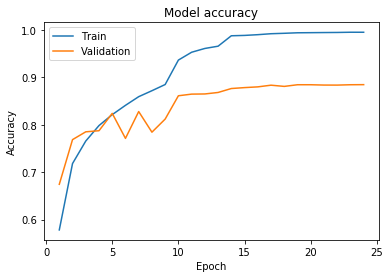

In [0]:
# Plot training & validation accuracy values
plt.plot(pd_log.acc)
plt.plot(pd_log.val_acc)
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.savefig(folder_path+"acc.pdf", bbox_inches='tight')

#### Loss history

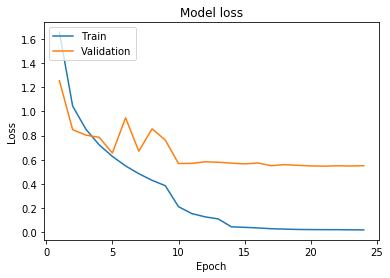

In [0]:
# Plot training & validation loss values
plt.plot(pd_log.loss)
plt.plot(pd_log.val_loss)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.savefig(folder_path+"loss.pdf", bbox_inches='tight')

### Model accuracy and loss

In [0]:
# Load best model trained
model = load_model(folder_path+model_file_name_best)

# Get val_loss and val_accuracy of the model
validation_generator.reset()
val_loss, val_accur = model.evaluate_generator(generator=validation_generator, verbose=1, steps=len(validation_generator))
print(val_loss, val_accur)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
1575/1575 [==============================] - 287s 182ms/step
0.5470340649453098 0.8836396839890428


### Metric evaluation with confusion matrix and classification report
At this step we are going to prepare the results of validation to generate a confusion matrix and the classification report.

#### Data preparation

In [0]:
validation_generator.reset()
Y_pred = model.predict_generator(generator=validation_generator, steps=len(validation_generator), verbose=1)
y_pred = np.argmax(Y_pred, axis=1)

1575/1575 [==============================] - 269s 171ms/step


#### Confusion matrix

In [0]:
print('Confusion Matrix')
conf_matrix = confusion_matrix(validation_generator.classes, y_pred)
print(conf_matrix)

Confusion Matrix
[[179   0  10 ...   1   0   2]
 [  0 216   0 ...   0   0   0]
 [  5   0 235 ...   0   0   0]
 ...
 [  2   0   2 ... 212   0   0]
 [  0   0   0 ...   0 202   0]
 [  1   0   0 ...   1   0 232]]


Confusion matrix, without normalization


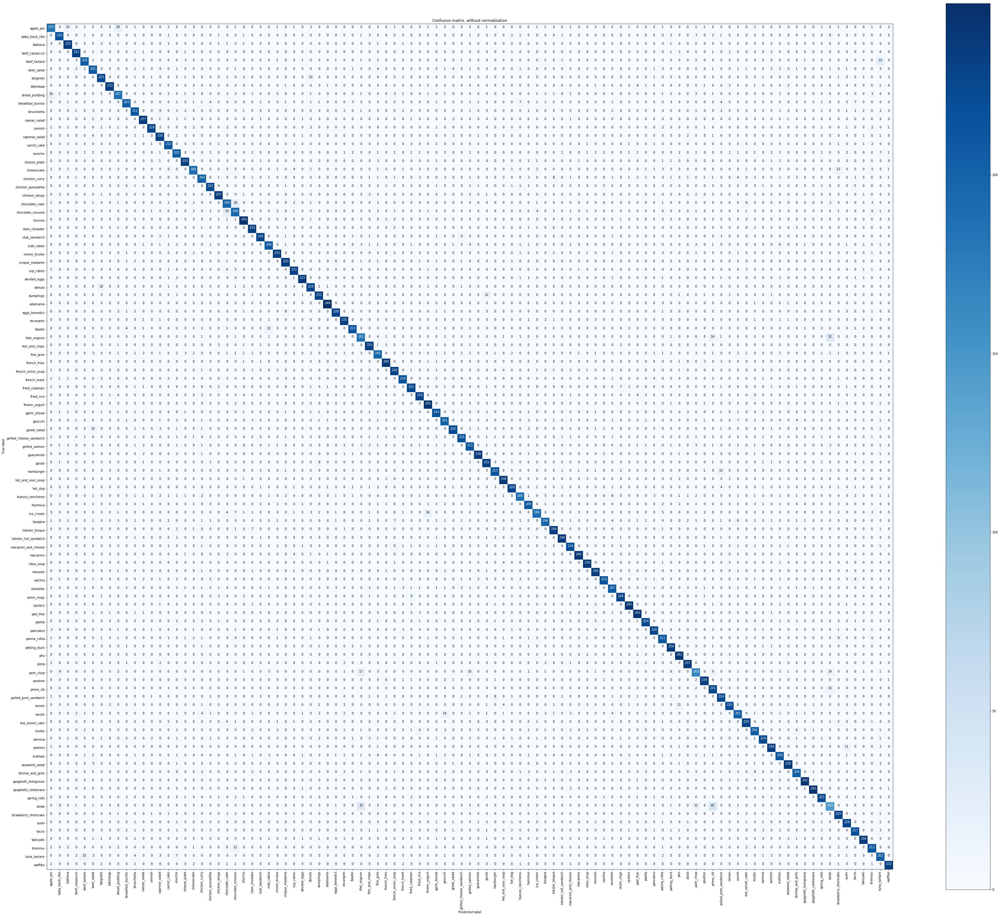

In [0]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.savefig(folder_path+"confusion_matrix.pdf", bbox_inches='tight')

# Plot non-normalized confusion matrix
plt.figure(figsize=(50, 42))
plot_confusion_matrix(conf_matrix, classes=list_classes, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
#plt.figure(figsize=(30, 25))
#plot_confusion_matrix(conf_matrix, classes=list_classes, normalize=True, title='Normalized confusion matrix')

plt.show()

#### Classification report

In [0]:
def classification_report_csv(report):
    report_data = []
    lines = report.split('\n')
    for line in lines[2:-5]:
        row = {}
        row_data = line.split()
        row['class'] = row_data[0]
        row['precision'] = float(row_data[1])
        row['recall'] = float(row_data[2])
        row['f1_score'] = float(row_data[3])
        row['support'] = float(row_data[4])
        report_data.append(row)
    dataframe = pd.DataFrame.from_dict(report_data)
    dataframe.to_csv(folder_path+'classification_report.csv', index = False)

print('Classification Report')
print(classification_report(validation_generator.classes, y_pred, target_names=list_classes))
report = classification_report(validation_generator.classes, y_pred, target_names=list_classes)
classification_report_csv(report)

Classification Report
                         precision    recall  f1-score   support

              apple_pie       0.77      0.72      0.74       250
         baby_back_ribs       0.86      0.86      0.86       250
                baklava       0.90      0.94      0.92       250
         beef_carpaccio       0.95      0.93      0.94       250
           beef_tartare       0.89      0.82      0.85       250
             beet_salad       0.81      0.82      0.82       249
               beignets       0.89      0.90      0.89       249
               bibimbap       0.98      0.93      0.96       250
          bread_pudding       0.79      0.75      0.77       250
      breakfast_burrito       0.87      0.82      0.84       249
             bruschetta       0.86      0.84      0.85       250
           caesar_salad       0.90      0.95      0.92       250
                cannoli       0.97      0.92      0.94       249
          caprese_salad       0.86      0.92      0.89       249
  

### Predicting tools
Here are tools for recognizing the class of the image

In [0]:
def load_image_own(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

#### Validation Generator prediction

In [0]:
mypath = 'food-101/test/apple_pie/'
print('Images of:', mypath.split('/')[2])
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

for file in onlyfiles[:10]:
  result = model.predict(load_image_own(mypath+file))
  print(round(result[0][np.argmax(result[0])]*100,2), list_classes[np.argmax(result[0])])

#### Predict one image

In [0]:
file = 'img.jpg'

result = model.predict(load_image_own(file))
print(round(result[0][np.argmax(result[0])]*100,2), list_classes[np.argmax(result[0])])

## Visualize dataset
Tool for visualize random images of each class and how image augmentation affects

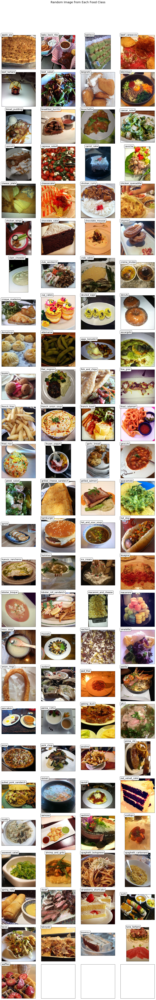

In [0]:
root_dir = 'food-101/test/'
rows = 26
cols = 4
fig, ax = plt.subplots(rows, cols, frameon=False, figsize=(15, 100))
fig.suptitle('Random Image from Each Food Class', fontsize=20)
sorted_food_dirs = sorted(os.listdir(root_dir))
for i in range(rows):
    for j in range(cols):
        try:
            food_dir = sorted_food_dirs[i*cols + j]
        except:
            break
        all_files = os.listdir(os.path.join(root_dir, food_dir))
        rand_img = np.random.choice(all_files)
        img = plt.imread(os.path.join(root_dir, food_dir, rand_img))
        ax[i][j].imshow(img)
        ec = (0, .0, .0)
        fc = (1, 1, 1)
        ax[i][j].text(0, -20, food_dir, size=15, rotation=0, ha="left", va="top", bbox=dict(boxstyle="round", ec=ec, fc=fc))
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

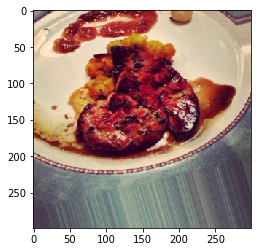

In [0]:
train_generator.reset()
x,y = train_generator.next()
for i, new_images in enumerate(x):
    # We access only first image because of batch_size=1
    new_image = array_to_img(new_images, scale=True)
    imgplot = plt.imshow(new_image)
    plt.show()
    if i >= 0:
        break 